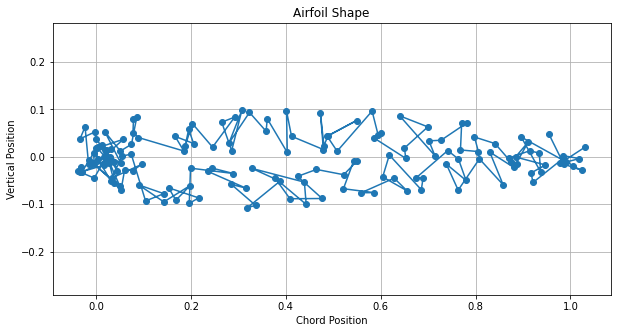

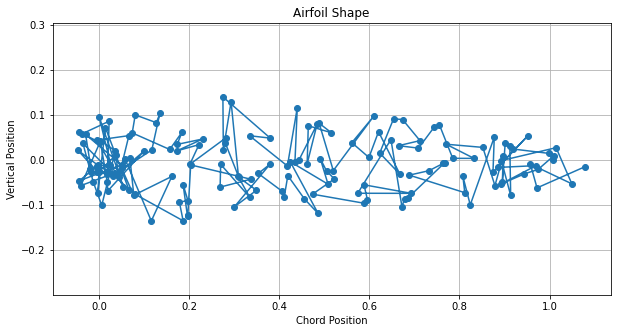

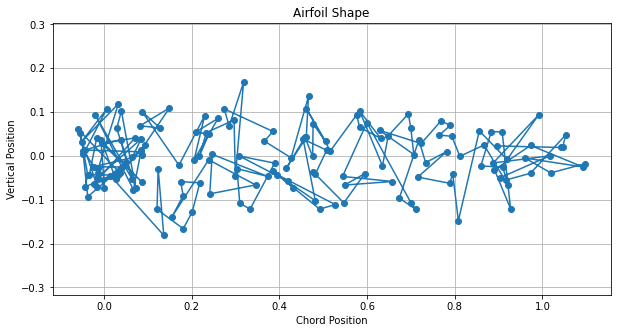

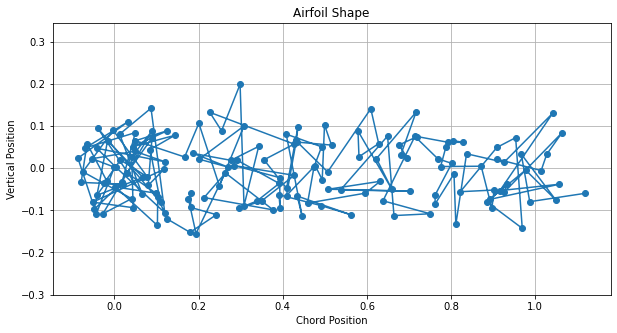

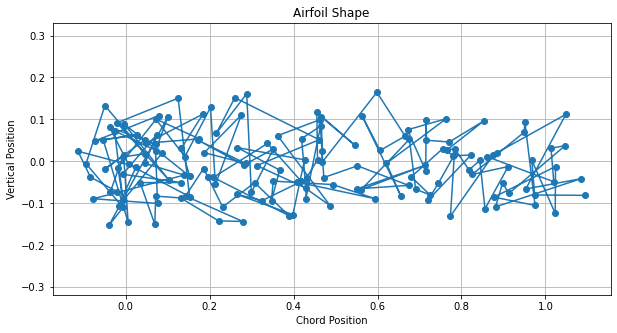

...

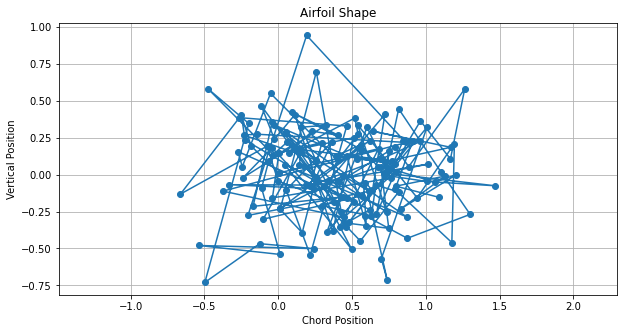

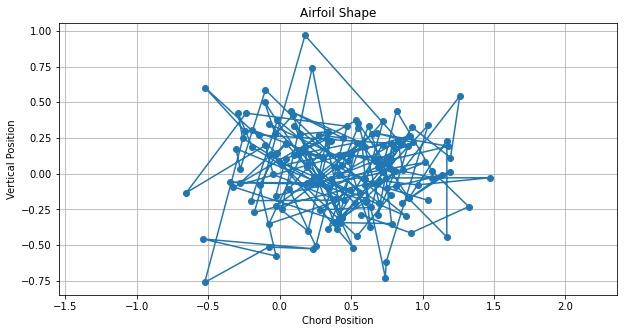

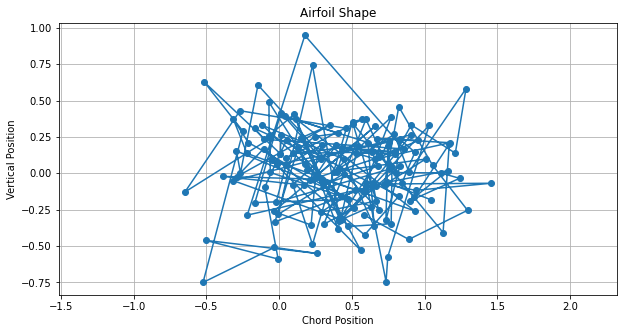

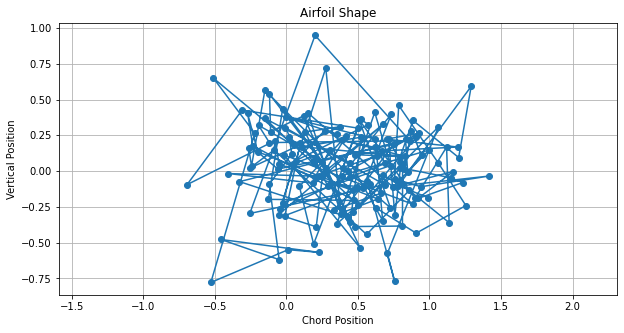

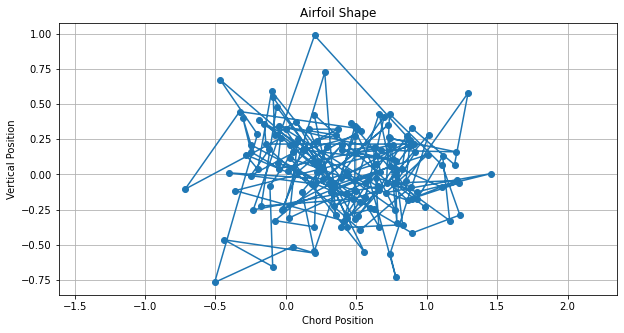

In [10]:
"""Example with many placeholders, does not use Xfoil, uses random number generator for reward"""
import numpy as np
import matplotlib.pyplot as plt
import gym
from gym import spaces
import os

class AirfoilOptimizationEnv(gym.Env):
    def __init__(self):
        super(AirfoilOptimizationEnv, self).__init__()
        # Load the initial shape to determine the correct number of control points
        self.current_state = self.generate_initial_airfoil()
        num_points = self.current_state.shape[0]

        # Define the action space as adjustments to the airfoil shape parameters.
        # Actions can adjust the camber and thickness at each control point.
        self.action_space = spaces.Box(low=-0.05, high=0.05, shape=(num_points, 2), dtype=np.float32)

        # Define the observation space that consists of the current state of the airfoil.
        self.observation_space = spaces.Box(low=0, high=1, shape=(num_points, 2), dtype=np.float32)

    def generate_initial_airfoil(self):
        """Load airfoil coordinates from a .dat file."""
        file_path = r'C:\Users\Jake\ME-599-L-Group-Project\xfoil-runner\xfoil_runner\NACA0012.dat'
        #change to your file path of .dat file
        
        if os.path.exists(file_path):
            data = np.loadtxt(file_path)
            # Normalize the x coordinates to be between 0 and 1
            data[:, 0] = (data[:, 0] - np.min(data[:, 0])) / (np.max(data[:, 0]) - np.min(data[:, 0]))
            return data
        else:
            raise FileNotFoundError("The specified .dat file does not exist.")

    def step(self, action):
        """Apply action, simulate environment, and return new state and reward."""
        self.current_state += action
        reward, done = self.simulate_airfoil_performance()
        return self.current_state, reward, done, {}

    def reset(self):
        """Reset the environment to initial state at the beginning of each episode."""
        self.current_state = self.generate_initial_airfoil()
        return self.current_state

    def render(self, mode='console'):
        """Render the environment to the screen."""
        if mode == 'console':
            print(f'Current airfoil shape: {self.current_state}')
        elif mode == 'human':
            self.plot_airfoil(self.current_state)

    def simulate_airfoil_performance(self):
        """Placeholder function to simulate aerodynamics and calculate reward."""
        reward = np.random.random()  # Dummy reward for placeholder
        done = False
        return reward, done

    def plot_airfoil(self, coordinates):
        """Plot the current airfoil shape."""
        x, y = coordinates[:, 0], coordinates[:, 1]
        plt.figure(figsize=(10, 5))
        plt.plot(x, y, 'o-')
        plt.title('Airfoil Shape')
        plt.xlabel('Chord Position')
        plt.ylabel('Vertical Position')
        plt.axis('equal')
        plt.grid(True)
        plt.show()

# Example usage
env = AirfoilOptimizationEnv()
current_state = env.reset()
for _ in range(100):
    action = env.action_space.sample()
    next_state, reward, done, info = env.step(action)
    if done:
        break
    env.render(mode='human')


In [15]:
import gym
from gym import spaces
import numpy as np
import os
import subprocess

class AirfoilOptimizationEnv(gym.Env):
    def __init__(self):
        super(AirfoilOptimizationEnv, self).__init__()
        # Load initial airfoil data to determine the number of control points.
        self.current_state = self.generate_initial_airfoil()
        num_points = self.current_state.shape[0]  # Get the number of control points from the loaded data.

        # Define action space and observation space to match the number of control points.
        self.action_space = spaces.Box(low=-0.05, high=0.05, shape=(num_points, 2), dtype=np.float32)
        self.observation_space = spaces.Box(low=0, high=1, shape=(num_points, 2), dtype=np.float32)
        
        self.airfoil_name = "NACA0012"

    def step(self, action):
        # Apply the action to modify the current state
        self.current_state += action
        # Run XFOIL simulation to get the reward
        reward, done = self.simulate_airfoil_performance()
        return self.current_state, reward, done, {}

    def reset(self):
        # Reset the airfoil to the initial state
        self.current_state = self.generate_initial_airfoil()
        return self.current_state

    def render(self, mode='console'):
        if mode == 'console':
            print(f'Current airfoil shape: {self.current_state}')

    def simulate_airfoil_performance(self):
        alpha_i = 0
        alpha_f = 10
        alpha_step = 0.25
        Re = 1000000
        n_iter = 100

        # Manage the polar file
        if os.path.exists("polar_file.txt"):
            os.remove("polar_file.txt")
        
        # Prepare the input file for XFOIL
        with open("input_file.in", 'w') as input_file:
            input_file.write(f"LOAD {self.airfoil_name}.dat\n")
            input_file.write(f"{self.airfoil_name}\n")
            input_file.write("PANE\n")
            input_file.write("OPER\n")
            input_file.write(f"Visc {Re}\n")
            input_file.write("PACC\n")
            input_file.write("polar_file.txt\n\n")
            input_file.write(f"ITER {n_iter}\n")
            input_file.write(f"ASeq {alpha_i} {alpha_f} {alpha_step}\n")
            input_file.write("\n\n")
            input_file.write("quit\n")
        
        # Run XFOIL
        subprocess.call("xfoil.exe < input_file.in", shell=True)
        
        # Process the results from the polar file
        try:
            polar_data = np.loadtxt("polar_file.txt", skiprows=12)
            lift_to_drag_ratio = np.max(polar_data[:, 1] / polar_data[:, 2])  # Assuming Cl and Cd columns
            reward = lift_to_drag_ratio
            done = False
        except:
            reward = -1  # Penalize if simulation fails
            done = True
        
        return reward, done

    def generate_initial_airfoil(self):
        # Load the airfoil data
        file_path = r'C:\Users\Jake\ME-599-L-Group-Project\xfoil-runner\xfoil_runner\NACA0012.dat'
        if os.path.exists(file_path):
            data = np.loadtxt(file_path)
            # Normalize x coordinates
            data[:, 0] = (data[:, 0] - np.min(data[:, 0])) / (np.max(data[:, 0]) - np.min(data[:, 0]))
            return data
        else:
            raise FileNotFoundError("The specified .dat file does not exist.")
            
    def plot_airfoil(self, coordinates):
        """Plot the current airfoil shape."""
        x, y = coordinates[:, 0], coordinates[:, 1]
        plt.figure(figsize=(10, 5))
        plt.plot(x, y, 'o-')
        plt.title('Airfoil Shape')
        plt.xlabel('Chord Position')
        plt.ylabel('Vertical Position')
        plt.axis('equal')
        plt.grid(True)
        plt.show()

# Example usage of the environment
env = AirfoilOptimizationEnv()
current_state = env.reset()
for _ in range(10):  # Simulate steps
    action = env.action_space.sample()
    next_state, reward, done, info = env.step(action)
    if done:
        break
    env.render(mode='human')

